In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    print(os.path.join(dirname))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input
/kaggle/input/chest-x-custom-json
/kaggle/input/chestxdetdataset
/kaggle/input/chestxdetdataset/test_data
/kaggle/input/chestxdetdataset/test_data/test
/kaggle/input/chestxdetdataset/train_data
/kaggle/input/chestxdetdataset/train_data/train


In [2]:
import json
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
from torch.utils.data import DataLoader
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.transforms.functional import crop
import torchvision.transforms.functional as F

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from PIL import Image,ImageDraw
from torch.utils.data import Dataset
from pathlib import Path

from itertools import chain
import cv2


In [15]:
from torch.utils.data import Dataset

def load_image(path:str):
    image = Image.open(path)
    if image.mode !='RGB' or image.mode != 'RGBA': # converts grayscale image to RGB
        image = image.convert("RGB")
    return image

class ImageDataset(Dataset):
    def __init__(self,folder:str,transforms_,image_size:int,train_json):
        
        self.folder = folder
        self.files = list(train_json.keys())
        self.transform = transforms_
        self.image_size = image_size
        self.train_json = train_json
    def __getitem__(self,index):
        img= self.transform(load_image(os.path.join(self.folder,self.files[index])))
        data = self.files[index]
        
        return img,data
    def __len__(self):
        return len(self.files)

In [16]:
train_json_path = '/kaggle/input/chest-x-custom-json/reformatted_ChestX_Det_train.json'
with open(train_json_path,'r')as f:
    train_json =  json.load(f)

In [111]:
train_path = '/kaggle/input/chestxdetdataset/train_data/train/'
transform = transforms.Compose([ transforms.ToTensor()])
dataset = ImageDataset(folder=train_path,transforms_=transform,image_size = 1024,train_json = train_json)

dataloader = torch.utils.data.DataLoader(dataset, batch_size=16, shuffle=True)

In [112]:
images, data = next(iter(dataloader))

In [115]:
def tensor_2_image(image):
    return image.numpy().transpose((1, 2, 0))
    
def imshow(image, ax=None, title=None, normalize=False):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()
        
    if normalize:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax
def draw_segment(tensor,poly,color= (255,0,0)):
    image = tensor_2_image(tensor)
    points = np.array([poly],dtype='int32')
    cv2.fillPoly(image,pts = points,color= color)
    return image

def get_mask(points):
    mask = np.full((1024,1024),False)
    if len(points) ==0:

        return mask
    for i, poly in enumerate(points):
        img = Image.new('L', (1024,1024), 0)
        poly = [(x,y) for x,y in poly]
        ImageDraw.Draw(img).polygon(poly, outline=1, fill=1)
        curr_mask = np.array(img)
        mask = np.dstack((mask,curr_mask))
    return mask[:,:,1:].transpose((2,0,1))
def generate_mask(data):
    mask = []
    for d in data: 
        polygons =  train_json[d]["polygons"]
        mask.append(get_mask(polygons))
    return mask

In [116]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False,figsize=(45, 20))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

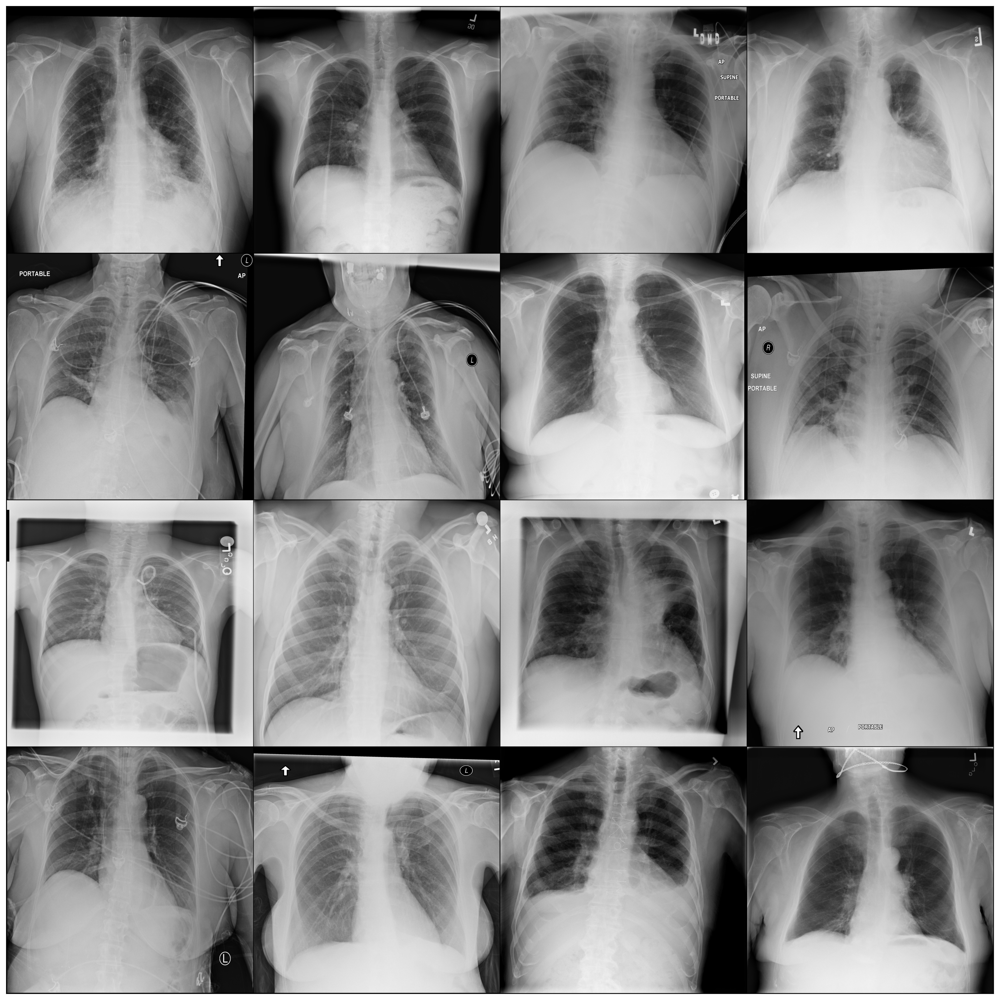

In [117]:
grid = vutils.make_grid(images,nrow =4)
show(grid)

In [128]:
maksed = [
    vutils.draw_segmentation_masks((img*255).to(torch.uint8), masks=torch.tensor(mask).to(torch.bool), alpha=0.2)
    for img, mask in zip(images, generate_mask(data))
]

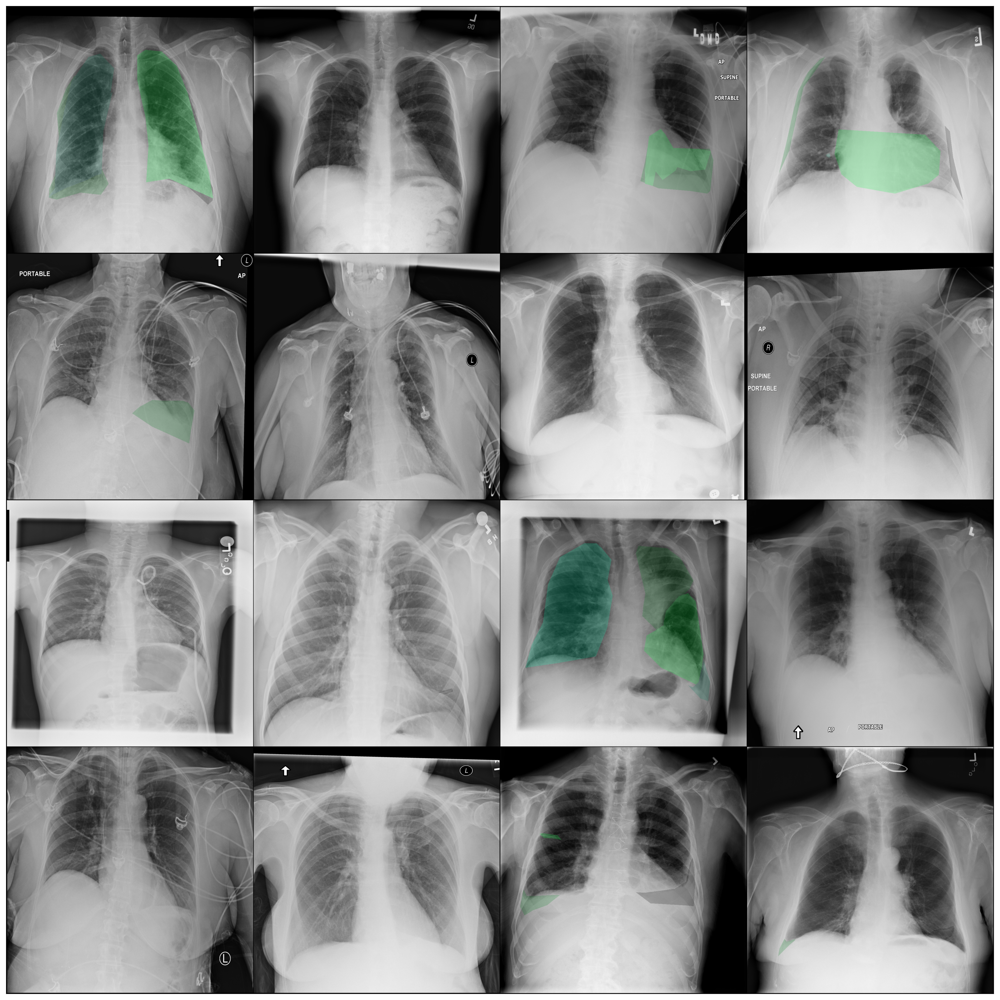

In [129]:
grid = vutils.make_grid(maksed,nrow =4) 
show(grid)

In [1]:
from kaggle.input.chest-x-custom-json.pre-trained_PSPNet.ptsemseg.pspnet import pspnet

SyntaxError: invalid syntax (408701689.py, line 1)